In [65]:
using JuMP
using SCS
using LinearAlgebra
using Plots
using ControlSystems
using RobustAndOptimalControl

# Stabilization of linear system
Найти матрицу $F$, чтобы матрица замкнутой системы $A + B F$ была гурвицева

$$
A W + W A^T + B L + L^T B^T < 0\\
W > 0\\
\Downarrow\\
F = L W^{-1}
$$

---
1. Boyd, Stephen P., ed. Linear Matrix Inequalities in System and Control Theory. SIAM Studies in Applied Mathematics, vol. 15. Philadelphia: Society for Industrial and Applied Mathematics, 1994.


In [66]:
function lmi_controller(A, B, Q = I, σ = 0.1)
    n, m = size(B)
    model = Model(SCS.Optimizer)
    set_silent(model)
    @variable(model, W[1:n, 1:n])
    @variable(model, L[1:m, 1:n])
    # @variable(model, a)
    
    @constraint(model, W - σ * I ∈ PSDCone())
    # @constraint(model, a * I - W ∈ PSDCone())
    @constraint(model, -(A * W + W * A' + B * L + L' * B' + Q) ∈ PSDCone())
    # @constraint(model, -(A * W + W * A' + B * L + L' * B' + Q) .== 0)
    
    @objective(model, Min, 1)
    
    optimize!(model)
    model
    w = value.(W)
    l = value.(L)
    F = l * inv(w)
end

lmi_controller (generic function with 3 methods)

In [67]:
A = [0 1; 0 0]
B = [
    0;
    1;;
]


2×1 Matrix{Int64}:
 0
 1

In [68]:
K = lmi_controller(A, B)

1×2 Matrix{Float64}:
 -2.45147  -2.14632

In [69]:
A + B * K |> eigvals

2-element Vector{ComplexF64}:
 -1.073161350606306 - 1.1400854204785689im
 -1.073161350606306 + 1.1400854204785689im

# Linear constraints on feedback matrix F
Пусть $F = F_0 C$

$$
(A + B F_0 C) W + W (A + B F_0 C)^T < 0\\
W > 0
$$

Численно решить эту проблему трудно, так как она не является выпуклой (а ЛМН - выпуклые проблемы).

Но можно предложить неэквивалентную систему, которая будет ЛМН, и если у нее есть решение, то есть решение и у проблемы выше.

$$
A W + W A^T + B N C + C^T N^T B^T < 0\\
W > 0\\
M C = C W\\
\Downarrow\\
F_0 = N M^{-1}
$$

---
Crusius, C.A.R., and A. Trofino. “Sufficient LMI Conditions for Output Feedback Control Problems.” IEEE Transactions on Automatic Control 44, no. 5 (May 1999): 1053–57. https://doi.org/10.1109/9.763227.


In [79]:
function lmi_C_controller(A, B, C; Q = I, σ = 0.1, m_mask = [], n_mask = [])
    n, m = size(B)
    r, n = size(C)
    
    model = Model(SCS.Optimizer)
    set_silent(model)
    @variable(model, W[1:n, 1:n] ∈ PSDCone())
    @variable(model, N[1:m, 1:r])
    @variable(model, M[1:r,1:r])
    # @variable(model, a)
    
    @constraint(model, W - σ * I ∈ PSDCone())
    @constraint(model, M * C .== C * W)
    @constraint(model, -(A * W + W * A' + B * N * C + C' * permutedims(N) * B' + Q) ∈ PSDCone())
    for ix in m_mask
        @constraint(model, M[ix] == 0)
    end
    for ix in n_mask
        @constraint(model, N[ix] == 0)
    end
    
    @objective(model, Min, 1)
    
    optimize!(model)

    w = value.(W)
    m = value.(M)
    n = value.(N)
    F = n * inv(m)
end

lmi_C_controller (generic function with 1 method)

In [80]:
A = [
0.0  0.0   1.0   4.0   3.0
 0.0  0.0   0.0   2.0   4.0
 0.0  0.0  -3.0  -4.0  -2.0
 0.0  0.0   1.0   0.0   0.0
 0.0  0.0   0.0  -2.0  -4.0
]
B = [
 0.0  0.0
 0.0  0.0
 1.0  0.0
 0.0  0.0
 0.0  1.0
]
C = [
 1.0  0.0  0.0  0.0  0.0
 0.0  0.0  1.0  4.0  3.0
 0.0  1.0  0.0  0.0  0.0
 0.0  0.0  0.0  2.0  4.0
]

4×5 Matrix{Float64}:
 1.0  0.0  0.0  0.0  0.0
 0.0  0.0  1.0  4.0  3.0
 0.0  1.0  0.0  0.0  0.0
 0.0  0.0  0.0  2.0  4.0

In [81]:
lmi_controller(A, B)

2×5 Matrix{Float64}:
 -4.47733  -4.01284  0.486116  -3.67812   -1.46361
 -3.89059  -6.47542  0.09081    0.157527   0.675211

In [85]:
F0 = lmi_C_controller(A, B, C)

2×4 Matrix{Float64}:
 -2.89978  -3.02796    0.420144  1.4988
 -3.12896  -0.159145  -4.91281   0.636581

In [86]:
F0 * C

2×5 Matrix{Float64}:
 -2.89978   0.420144  -3.02796   -9.11423   -3.08868
 -3.12896  -4.91281   -0.159145   0.636582   2.06889

In [87]:
eigvals(A + B * F0 * C)

5-element Vector{ComplexF64}:
  -2.232603076397665 - 1.6352522444053832im
  -2.232603076397665 + 1.6352522444053832im
   -1.41657504726652 - 5.361435342306943im
   -1.41657504726652 + 5.361435342306943im
 -0.6607120491649564 + 0.0im

In [88]:
m_mask = findall(Bool[
    0 0 1 1
    0 0 1 1
    1 1 0 0
    1 1 0 0
]
)

8-element Vector{CartesianIndex{2}}:
 CartesianIndex(3, 1)
 CartesianIndex(4, 1)
 CartesianIndex(3, 2)
 CartesianIndex(4, 2)
 CartesianIndex(1, 3)
 CartesianIndex(2, 3)
 CartesianIndex(1, 4)
 CartesianIndex(2, 4)

In [89]:
n_mask = findall(Bool[
    0 0 1 1
    1 1 0 0
])

4-element Vector{CartesianIndex{2}}:
 CartesianIndex(2, 1)
 CartesianIndex(2, 2)
 CartesianIndex(1, 3)
 CartesianIndex(1, 4)

In [91]:
F0 = lmi_C_controller(A, B, C; m_mask, n_mask, Q = 0.001I)

2×4 Matrix{Float64}:
 -0.793831  -11769.1      -0.0468374      7.36475
 -0.051014       1.24604  -0.476416   -6352.26

In [92]:
eigvals(A + B * F0 * C)

5-element Vector{Float64}:
 -25404.772141538127
 -11774.140826350847
     -2.5000012101238775
     -7.804609101018877e-5
     -6.43911526386819e-5

In [102]:
M = I(4)
W = I(5)
N = -Fpid

2×4 Matrix{Int64}:
 900  40    0   0
   0   0  900  40

In [104]:
lmi_11 = W * A' + A * W - B * N * C - C' * N' * B'

5×5 Matrix{Float64}:
    0.0     0.0  -899.0     4.0     3.0
    0.0     0.0     0.0     2.0  -896.0
 -899.0     0.0   -86.0  -163.0  -122.0
    4.0     2.0  -163.0     0.0   -82.0
    3.0  -896.0  -122.0   -82.0  -328.0

In [169]:
x = randn(5)
x' * lmi_11 * x

-413.68620342299744

In [105]:
svdvals(lmi_11)

5-element Vector{Float64}:
 1114.9658170669913
  924.4066762353306
  890.9582322822864
  736.1656638422247
    1.7514028221893034

In [ ]:
N M-1 = F
N = F M
N C = F M C

In [96]:
Fpid = -[
    900 40 0 0
    0 0 900 40
]
eigvals(A + B * Fpid * C)

5-element Vector{ComplexF64}:
 -137.27001149160986 + 0.0im
  -26.23029660354342 + 0.0im
 -20.501108973666277 - 21.919316016760988im
 -20.501108973666277 + 21.919316016760988im
 -2.4974739575143072 + 0.0im

In [93]:
lmi_controller(A, B)

2×5 Matrix{Float64}:
 -4.47733  -4.01284  0.486116  -3.67812   -1.46361
 -3.89059  -6.47542  0.09081    0.157527   0.675211

In [95]:
lmi_C_controller(A, B, I(5))

2×5 Matrix{Float64}:
 -2.87045  -1.90291   0.886478  -2.98297  -0.932593
 -3.12686  -5.02102  -0.12056    0.61922   2.036

# $H_\infty$ оптимизация

In [18]:
function lmi_main(A, B, C, W, N)
    NT = permutedims(N)
    W * A' + A * W - B * N * C - C' * NT * B'
end

lmi_main (generic function with 1 method)

In [138]:
function lmi_hinfty_controller(A, Bu, Bw, Cy, Cz, Duz, Dwz; σ = 0.01, m_mask = [], n_mask = [])
    n, m = size(Bu)
    r, n = size(Cy)
    n, q = size(Bw)
    p, n = size(Cz)
    
    model = Model(SCS.Optimizer)
    set_silent(model)
    @variable(model, W[1:n, 1:n])
    @variable(model, N[1:m, 1:r])
    @variable(model, M[1:r,1:r])
    @variable(model, γ)
    NT = permutedims(N)
    lmi_13 = W * Cz' - Cy' * NT * Duz'
    lmi = [
        lmi_main(A, Bu, Cy, W, N) Bw lmi_13
        Bw' -γ * I(q) Dwz'
        lmi_13' Dwz -I(p)
    ]
    @constraint(model, W - σ * I ∈ PSDCone())
    @constraint(model, M * Cy .== Cy * W)
    @constraint(model, γ >= 0)
    @constraint(model, -lmi ∈ PSDCone())
    for ix in m_mask
        @constraint(model, M[ix] == 0)
    end
    for ix in n_mask
        @constraint(model, N[ix] == 0)
    end
    
    @objective(model, Min, γ)
    
    optimize!(model)

    w = value.(W)
    @show m = value.(M)
    @show n = value.(N)
    @show gamma = value.(γ)
    F = n * inv(m)
    F, gamma
end

lmi_hinfty_controller (generic function with 1 method)

In [139]:
sys = ss(A, B, C, 0)

StateSpace{Continuous, Int64}
A = 
 0  1  0  0
 0  0  0  0
 0  0  0  1
 0  0  0  0
B = 
 0  0
 1  0
 0  0
 0  1
C = 
 1  1  0  1
 0  0  1  1
D = 
 0  0
 0  0

Continuous-time state-space model

In [140]:
n, m = size(B)
r, n = size(C)

(2, 4)

In [141]:
Duz = zeros(r + m, m)
Dwz = zeros(r + m, m)

Duz[CartesianIndex.(r+1:r+m, 1:m)] .= 1
Duz

4×2 Matrix{Float64}:
 0.0  0.0
 0.0  0.0
 1.0  0.0
 0.0  1.0

In [142]:
ess = ExtendedStateSpace(sys; C1 = [10 * C; zeros(m, n)], C2 = I(n), D12 = Duz)

lft(ess, ss(-ones(m, n)))

StateSpace{Continuous, Float64}
A = 
  0.0   1.0   0.0   0.0
 -1.0  -1.0  -1.0  -1.0
  0.0   0.0   0.0   1.0
 -1.0  -1.0  -1.0  -1.0
B = 
 0.0  0.0
 1.0  0.0
 0.0  0.0
 0.0  1.0
C = 
 10.0  10.0   0.0  10.0
  0.0   0.0  10.0  10.0
 -1.0  -1.0  -1.0  -1.0
 -1.0  -1.0  -1.0  -1.0
D = 
 0.0  0.0
 0.0  0.0
 0.0  0.0
 0.0  0.0

Continuous-time state-space model

In [143]:
F, γ = lmi_hinfty_controller(ess.A, ess.B2, ess.B1, ess.C2, ess.C1, ess.D12, ess.D11)

m = value.(M) = [0.4272492275483244 -0.21783970964812427 0.19507652606065548 -0.15612181565563188; -0.21783971054609455 0.15161533054300583 -0.05198596932753863 0.043773785572903436; 0.19507652673944645 -0.051985968439307924 0.1966563603290383 -0.14315073564587985; -0.15612181685358395 0.043773785100584196 -0.1431507366574905 0.12061713482980871]
n = value.(N) = [-0.0019296946305956413 1.0020616245565204 0.00010969182027165703 -0.0004226312069450345; -0.0005298627967031363 0.00048318288396375796 -4.7786245555271943e-5 1.0000149933590319]
gamma = value.(γ) = 1.0610623991143782


([39.306968655789724 54.05801193045071 -14.321443084334547 14.258370089013603; 14.271356057457186 14.287105171782418 39.144244761310524 68.03520727078376], 1.0610623991143782)

In [144]:
A - B * F

4×4 Matrix{Float64}:
   0.0       1.0       0.0       0.0
 -39.307   -54.058    14.3214  -14.2584
   0.0       0.0       0.0       1.0
 -14.2714  -14.2871  -39.1442  -68.0352

In [161]:
closed = feedback(ess, ss(F))

StateSpace{Continuous, Float64}
A = 
   0.0                       1.0                       0.0                      0.0
 -48.66598236946679        -57.090712034979326         0.0002817250270655794    0.00017817371831174827
   0.0                       0.0                       0.0                      1.0
   0.00015877598923294943    0.00017862269680090183  -30.32606351615567       -54.50185088139723
B = 
 0.0  0.0
 1.0  0.0
 0.0  0.0
 0.0  1.0
C = 
  10.0                      10.0                       0.0                     10.0
   0.0                       0.0                      10.0                     10.0
 -48.66598236946679        -57.090712034979326         0.0002817250270655794    0.00017817371831174827
   0.00015877598923294943    0.00017862269680090183  -30.32606351615567       -54.50185088139723
D = 
 0.0  0.0
 0.0  0.0
 0.0  0.0
 0.0  0.0

Continuous-time state-space model

In [162]:
h, w0 = hinfnorm(closed)

(1.0538142206406698, 1.1919654932752337)

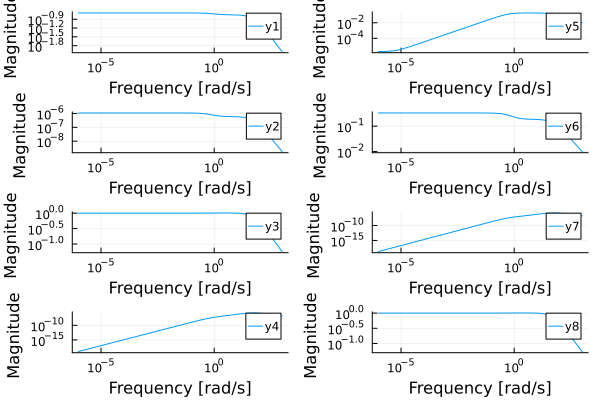

In [163]:
bodeplot(closed; plotphase=false)

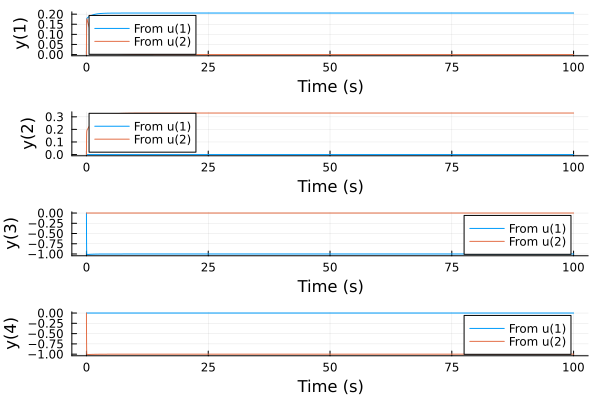

In [164]:
plot(step(closed, 100))

In [155]:
m_mask = (.!Bool[
    1 1 0 0
    1 1 0 0
    0 0 1 1
    0 0 1 1
]) |> findall

8-element Vector{CartesianIndex{2}}:
 CartesianIndex(3, 1)
 CartesianIndex(4, 1)
 CartesianIndex(3, 2)
 CartesianIndex(4, 2)
 CartesianIndex(1, 3)
 CartesianIndex(2, 3)
 CartesianIndex(1, 4)
 CartesianIndex(2, 4)

In [168]:
n_mask = .!(Bool[
    1 1 0 0
    0 0 1 1
]) |> findall

f_mask = Bool[
    1 1 0 0
    0 0 1 1
]

2×4 Matrix{Bool}:
 1  1  0  0
 0  0  1  1

In [159]:
F, γ = lmi_hinfty_controller(ess.A, ess.B2, ess.B1, ess.C2, ess.C1, ess.D12, ess.D11; m_mask, n_mask)

m = value.(M) = [0.30010673195134974 -0.25581021160716294 2.7163878497533106e-8 2.0909309514724245e-8; -0.2558102115169508 0.23556764824910037 2.761670926104747e-8 1.1162057421514226e-8; 2.76821105780917e-8 2.808196358957714e-8 0.015885527794713913 -0.008839456238514018; 2.0491186063629583e-8 1.118622581611191e-8 -0.008839456795161377 0.023266529024643653]
n = value.(N) = [0.0006018047698424014 0.9994695229330255 -1.7774350433461214e-9 -3.66046317740942e-10; 6.36201990897313e-11 7.621734811765733e-11 -2.123124153428782e-5 1.0000029840860607]
gamma = value.(γ) = 1.1224789921774199


([48.66598236946679 57.090712034979326 -0.0002817250270655794 -0.00017817371831174827; -0.00015877598923294943 -0.00017862269680090183 30.32606351615567 54.50185088139723], 1.1224789921774199)

In [160]:
F

2×4 Matrix{Float64}:
 48.666        57.0907       -0.000281725  -0.000178174
 -0.000158776  -0.000178623  30.3261       54.5019

In [169]:
(F .* f_mask) * ess.C2 

2×4 Matrix{Float64}:
 48.666  57.0907   0.0      0.0
  0.0     0.0     30.3261  54.5019

In [172]:
closed = feedback(ess, ss(F))
hinfnorm2(closed)

(1.0537517301741715, 0.8655552993534577)

In [208]:
function bug()
    model = Model(SCS.Optimizer)
    @variable(model, B[1:2, 1:3])
    A = I(3)
    @show B * A
    @show transpose(A) * transpose(B)
    @show A' * permutedims(B)
end

bug (generic function with 1 method)

In [209]:
bug()

B * A = AffExpr[B[1,1] B[1,2] B[1,3]; B[2,1] B[2,2] B[2,3]]
transpose(A) * transpose(B) = AffExpr[0 0; 0 0; 0 0]
A' * permutedims(B) = AffExpr[B[1,1] B[2,1]; B[1,2] B[2,2]; B[1,3] B[2,3]]


3×2 Matrix{AffExpr}:
 B[1,1]  B[2,1]
 B[1,2]  B[2,2]
 B[1,3]  B[2,3]

In [ ]:
hinfsynthesize_lmi

In [173]:
# use block_sizes instead of masks

In [2]:
# test block matrix variable

In [14]:
model = Model(SCS.Optimizer)
a = @variable(model, [1:2, 1:3])

2×3 Matrix{VariableRef}:
 _[1]  _[3]  _[5]
 _[2]  _[4]  _[6]

In [57]:
model = Model(SCS.Optimizer)
A = map([1, 2], [2, 1], 1:2) do m, n, i
    a = @variable(model, [1:m, 1:n])
    a
end

2-element Vector{Matrix{VariableRef}}:
 [_[1] _[2]]
 [_[3]; _[4];;]

In [60]:
N = zeros(AffExpr, 3, 3)

3×3 Matrix{AffExpr}:
 0  0  0
 0  0  0
 0  0  0

In [62]:
N[1:2, 1:1] = A[1]
N[3:3, 2:3] = A[2]
N

3×3 Matrix{AffExpr}:
 _[1]  0     0
 _[2]  0     0
 0     _[3]  _[4]

In [24]:
reduce((a, b) -> cat(a, b; dims=(1,2)), A)

LoadError: MethodError: [0mCannot `convert` an object of type [92mAffExpr[39m[0m to an object of type [91mVariableRef[39m

[0mClosest candidates are:
[0m  convert(::Type{T}, [91m::T[39m) where T
[0m[90m   @[39m [90mBase[39m [90m[4mBase.jl:64[24m[39m
[0m  VariableRef(::Any, [91m::Any[39m)
[0m[90m   @[39m [35mJuMP[39m [90mC:\Users\liotb\.julia\packages\JuMP\ptoff\src\[39m[90m[4mvariables.jl:230[24m[39m
